In [10]:
import pandas as pd
import matplotlib

In [11]:
df = pd.read_csv('winequality-red.csv')

In [12]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


Предметная область: химия, виноделие

Источник данных: https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009/

Характер данных: данные являются реальными. 
По этим данным можно выявить зависимости между химическими характеристиками красного вина и его качеством.

Атрибуты:
1. Фиксированная кислотность - числовой, показывает степень фиксированной кислотности

2. Летучая кислотность - числовой, показывает степень летучей кислотности

3. Лимонная кислота - числовой, показывает концентрацию лимонной кислоты в напитке

4. Остаточный сахар - числовой, показывает содержание остаточного сахара

5. Хлориды - числовой, показывает концентрацию хлоридов в напитке

6. Свободный диоксид серы - числовой, показывает содержание свободный диоксида серы

7. Общий диоксид серы - числовой, показывает содержание общего диоксида серы

8. Плотность - числовой, показатель плотности напитка относительно воды

9. pH - числовой, показатель кислотности среды напитка

10. Сульфаты - числовой,  показывает концентрацию сульфатов

11. Алкоголь - числовой, показывает концентрацию алкоголя в напитке

12. Качество - числовой, является оценкой конкретного вина, выходным значением

Рассчитаем для каждого атрибута среднее значение и стандартное отклонение при помощи функций mean() и std()

In [13]:

sr = []
sko = []
for atr in df.columns:
    sr.append(df[atr].mean())
    sko.append(df[atr].std())
new_df = pd.DataFrame({'mean':sr,
                      'std':sko},
                     index=df.columns)
new_df



,mean,std
fixed acidity,8.319637,1.741096
volatile acidity,0.527821,0.179060
citric acid,0.270976,0.194801
residual sugar,2.538806,1.409928
chlorides,0.087467,0.047065
free sulfur dioxide,15.874922,10.460157
total sulfur dioxide,46.467792,32.895324
density,0.996747,0.001887
pH,3.311113,0.154386
sulphates,0.658149,0.169507


Для построения гистограмм воспользуемся функцией hist()

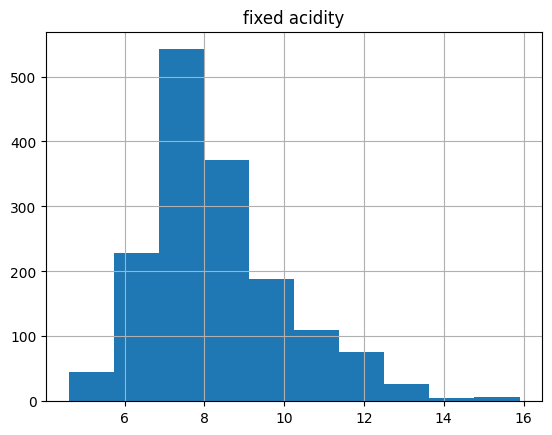

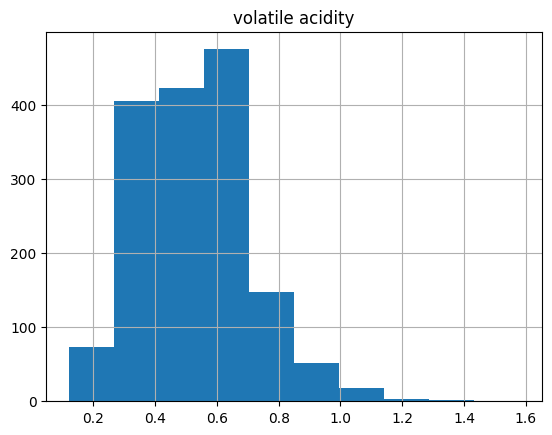

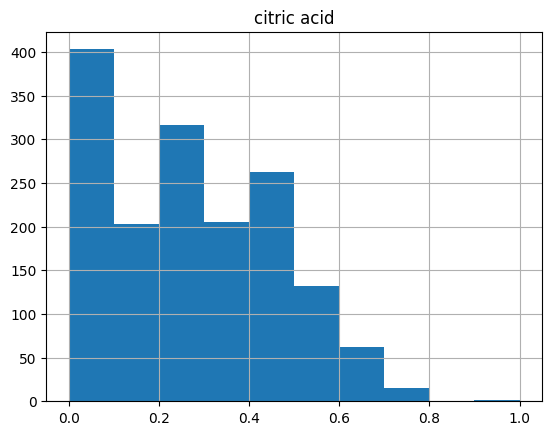

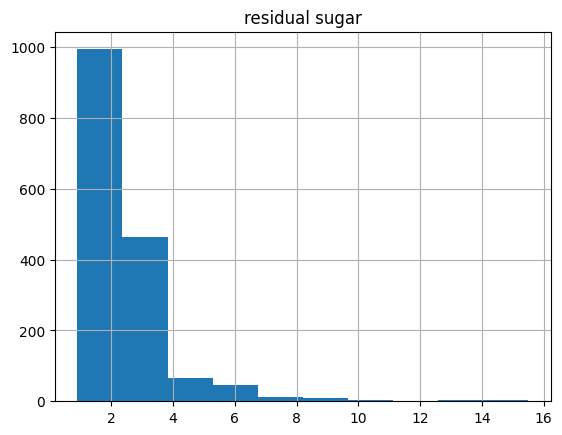

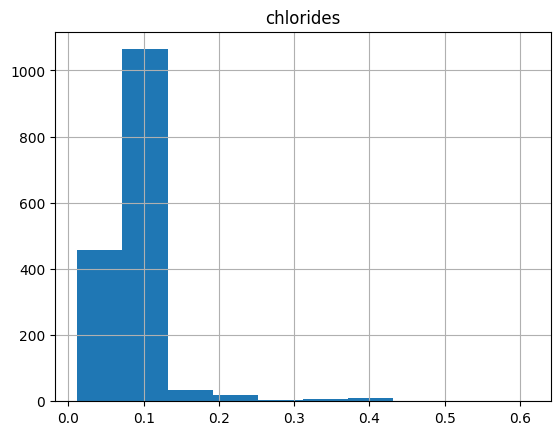

...

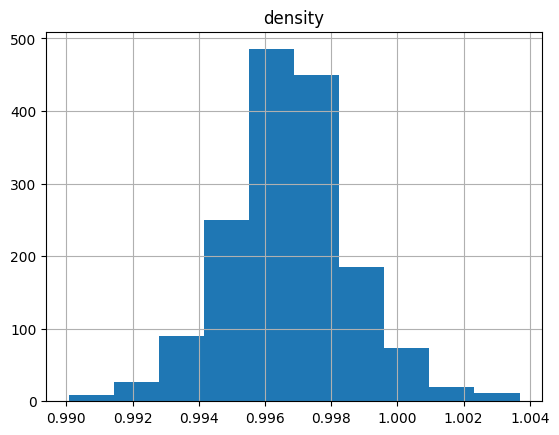

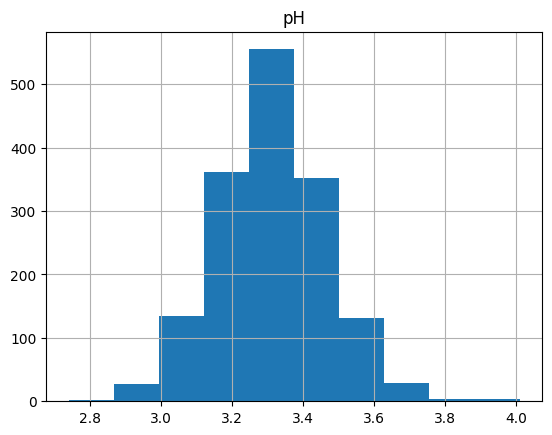

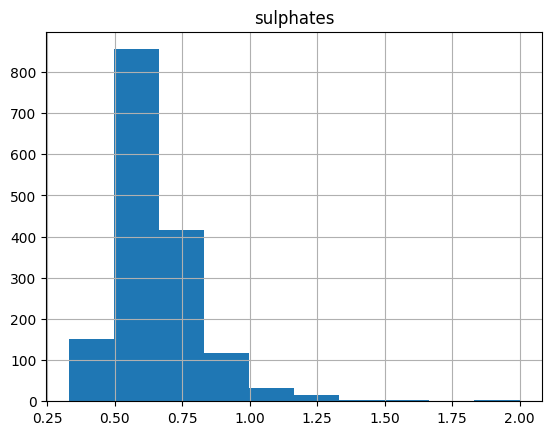

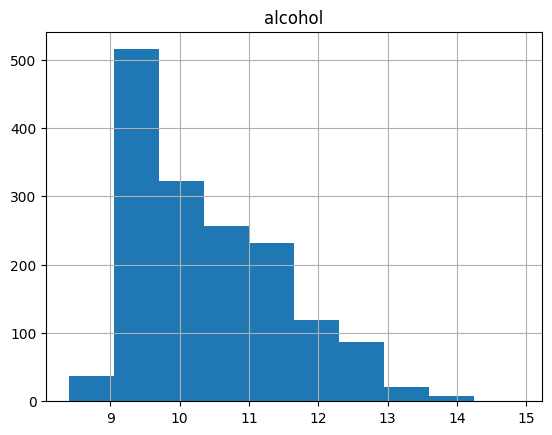

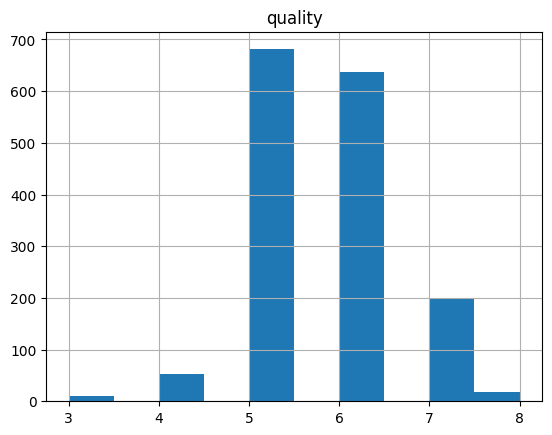

In [14]:
for atr in df.columns:
    df.hist(column = atr)

Определение выбросов

In [15]:

for atr in df.columns:
    q1=df[atr].quantile(0.25)
    q3=df[atr].quantile(0.75)
    IQR=q3-q1
    outliers = df[atr][((df[atr]<(q1-1.5*IQR)) | (df[atr]>(q3+1.5*IQR)))]
    print(f"number of outliers in {atr} : {str(len(outliers))}")
    print("outliers are:")
    print(outliers)
#outlier_df = pd.

number of outliers in fixed acidity : 49
outliers are:
205     12.8
206     12.8
243     15.0
244     15.0
264     12.5
294     13.3
328     13.4
338     12.4
339     12.5
347     13.8
353     13.5
359     12.6
363     12.5
364     12.8
366     12.8
374     14.0
381     13.7
391     13.7
394     12.7
409     12.5
429     12.8
440     12.6
442     15.6
446     12.5
470     13.0
472     12.5
509     13.3
510     12.4
516     12.5
538     12.9
544     14.3
548     12.4
554     15.5
555     15.5
557     15.6
559     13.0
560     12.7
564     13.0
565     12.7
596     12.4
599     12.7
601     13.2
603     13.2
611     13.2
652     15.9
680     13.3
811     12.9
814     12.6
1224    12.6
Name: fixed acidity, dtype: float64
number of outliers in volatile acidity : 19
outliers are:
38      1.130
94      1.020
120     1.070
126     1.330
127     1.330
134     1.040
199     1.090
553     1.040
672     1.240
690     1.185
700     1.020
705     1.035
710     1.025
724     1.115
899     1.020
1261

Для определения выбросов я использовала межквартильный размах: все значения, меньшие, чем первый квартиль, на 1.5 межквартильных размаха и большие, чем третий квартиль, на 1.5 межквартильных размаха можно определить как выбросы.

Для определения количества пропущенных данных используем функцию info():

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Исходя из того, что non-null count для каждого из атрибутов равен 1599, пропущенных значений в датасете нет

Для определения корреляции удобен метод corr()

In [17]:
for i in range(len(df.columns)):
    for j in range(i+1, len(df.columns)):
        print(f'Корреляция между {df.columns[i]} и {df.columns[j]} : {df[df.columns[i]].corr(df[df.columns[j]])}')

Корреляция между fixed acidity и volatile acidity : -0.25613089477038203
Корреляция между fixed acidity и citric acid : 0.671703434764106
Корреляция между fixed acidity и residual sugar : 0.11477672449492142
Корреляция между fixed acidity и chlorides : 0.09370518632130538
Корреляция между fixed acidity и free sulfur dioxide : -0.15379419286482515
Корреляция между fixed acidity и total sulfur dioxide : -0.11318144304548117
Корреляция между fixed acidity и density : 0.6680472921189738
Корреляция между fixed acidity и pH : -0.6829781945685316
Корреляция между fixed acidity и sulphates : 0.18300566393215348
Корреляция между fixed acidity и alcohol : -0.06166827062815111
Корреляция между fixed acidity и quality : 0.12405164911322428
Корреляция между volatile acidity и citric acid : -0.5524956845595798
Корреляция между volatile acidity и residual sugar : 0.0019178819627907178
Корреляция между volatile acidity и chlorides : 0.06129777247646148
Корреляция между volatile acidity и free sulfur d

Будем считать высокой корреляцию между параметрами, если по модулю она превышает 0.5.
Высококоррелятивны следующие параметры: 
- фиксированная кислотность и лимонная кислота, корреляция положительная
- фиксированная кислотность и плотность, корреляция положительная
- фиксированная кислотность и pH, корреляция отрицательная
- летучая кислотность и лимонная кислота, корреляция положительная
- лимонная кислота и pH, корреляция отрицательная
- cвободный диоксид серы и общий диоксид серы, корреляция положительная

Практически отсутствующей будем считать корреляцию, меньшую чем 0.1
Не имеют корреляцию следующие параметры:
- фиксированная кислотность и хлориды
- фиксированная кислотность и алкоголь
- летучая кислотность и остаточный сахар
- летучая кислотность и хлориды
- летучая кислотность и свободный диоксид серы
- летучая кислотность и общий диоксид серы
- летучая кислотность и плотность
- лимонная кислота и свободный диоксид серы
- лимонная кислота и общий диоксид серы
- остаточный сахар и хлориды
- остаточный сахар и pH
- остаточный сахар и сульфаты
- остаточный сахар и алкоголь
- остаточный сахар и качество
- хлориды и свободный диоксид серы
- хлориды и общий диоксид серы
- свободный диоксид серы и плотность
- свободный диоксид серы и pH
- свободный диоксид серы и сульфаты
- свободный диоксид серы и алкоголь
- свободный диоксид серы и качество
- общий диоксид серы и плотность
- общий диоксид серы и pH
- общий диоксид серы и сульфаты
- pH и качество
- сульфаты и алкоголь

Построим матрицу рассеяния:

In [18]:
pd.plotting.scatter_matrix(df, figsize=(150, 150))


array([[<Axes: xlabel='fixed acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='citric acid', ylabel='fixed acidity'>,
        <Axes: xlabel='residual sugar', ylabel='fixed acidity'>,
        <Axes: xlabel='chlorides', ylabel='fixed acidity'>,
        <Axes: xlabel='free sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='total sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='density', ylabel='fixed acidity'>,
        <Axes: xlabel='pH', ylabel='fixed acidity'>,
        <Axes: xlabel='sulphates', ylabel='fixed acidity'>,
        <Axes: xlabel='alcohol', ylabel='fixed acidity'>,
        <Axes: xlabel='quality', ylabel='fixed acidity'>],
       [<Axes: xlabel='fixed acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='citric acid', ylabel='volatile acidity'>,
        <Axes: xlabel='residual sugar', ylabel='vol

Полученные в результате анализа коэффициентов корреляции данные соответствуют выводам, которые можно получить из графиков матрицы рассеяния.

Качество вина напрямую не зависит от какого-то одного химического параметра, скорее, зависит от их совокупности. 